In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import pandas as pd
import anndata
import scvelo as scv

from scipy.sparse import csr_matrix
from sklearn.preprocessing import StandardScaler, Normalizer
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.neighbors import kneighbors_graph
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from matplotlib.axes._axes import _log as matplotlib_axes_logger
from RnaVeloDataset import RnaVeloDataset
from symsimDataset import SymsimBifur, SymsimTree, SymsimBranch, SymsimLinear, dyngenCircle
from unsupervised_loss import UnsupervisedLoss

import torch
import torch.nn.functional as F
import torch.nn as nn
from sklearn.metrics import roc_auc_score
from torch_geometric.data import DataLoader
from model.BaseModel import BaseModel
from sklearn.metrics import mean_squared_error
from model.mymodel import MyModel, GraphSAGEModel, FCModel, veloModel, DiffusionModel
from math import sqrt
import scprep
import utils

from torch_geometric.data import Data

In [2]:
dataBifur = SymsimBifur()
dataTree = SymsimTree()
dataBranch = SymsimBranch()
# datalinear = SymsimLinear(root="data/")
dataCircle = dyngenCircle()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
dataTree.num_features

300

In [3]:
def train(model, train_loader, lamb = None):
    model.train()

    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        """
        Note that here I change the output of the model to incorporate the adj matrix (after the sigmoid transform)
        """
        # output = model(data)
        output, node_embed, adj = model(data)

        loss = 0
        if lamb:
            adj = adj.numpy()
            # eliminate self node
            adj = adj - adj[0,0] * np.diag(np.ones(adj.shape[0]))
            train_nodes = np.arange(adj.shape[0])

            unsupervised_loss = unsup_loss.UnsupervisedLoss(adj = adj, train_nodes=train_nodes, device = device)
            nodes_batch = np.asarray(list(unsupervised_loss.extend_nodes(nodes=train_nodes, num_neg=6)))
            loss_net = unsupervised_loss.get_loss_sage(node_embed, nodes_batch)

            loss = lamb * loss_net


        label = data.y.to(device)
        # pearson correlation loss
        vx = output - torch.mean(output)
        vy = label - torch.mean(label)
        loss += -torch.sum(vx * vy) / (torch.sqrt(torch.sum(vx ** 2)) * torch.sqrt(torch.sum(vy ** 2)))


        loss.backward()
        total_loss += data.num_graphs * loss.item()
        optimizer.step()

    return float(total_loss / len(train_loader.dataset))

def test(model, loader):
    model.eval()
    
    correct = []
    predict = []
    for data in loader:
        data = data.to(device)
        label = data.y.detach().cpu().numpy().reshape(-1)
        
        pred,_,_ = model(data)

        pred = pred.detach().cpu().numpy().reshape(-1)
        correct.extend(label)
        predict.extend(pred)
    correct = np.array(correct)
    predict = np.array(predict)

    vx = predict - np.mean(predict)
    vy = correct - np.mean(correct)
    neg_pearson_loss = -np.sum(vx * vy) / (np.sqrt(np.sum(vx ** 2)) * np.sqrt(np.sum(vy ** 2)))

    return neg_pearson_loss

In [4]:
len(dataTree)

100

In [6]:
t = np.arange(1,10)
# dataset for training
train_mask = list(t) + list(t+10) + list(t+20) + list(t+30) + list(t+40) + list(t+50) + list(t+60) + list(t+70) + list(t+80) + list(t+90)

# dataset for validation
val_mask = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90]

# Test Diffusion NN
On tree, linear, bifurcating

In [7]:
# mask the dataset
train_loader = DataLoader(dataTree[train_mask], batch_size=1, shuffle=True)
val_loader = DataLoader(dataTree[val_mask], batch_size=1)

model = DiffusionModel(dataTree.num_features, hidden1 = 128, hidden2 = 64, max_diffusion = 2, include_reversed = True, device = device).to(device)

# reset parameters
model.reset_parameters()
print(model)

optimizer = torch.optim.Adam(params=model.parameters(), lr=1e-4, weight_decay=0.05)

train_list = []
val_list = []
for epoch in range(0, 81):

    train_loss = train(model, train_loader,lamb=None)
    train_acc = test(model, train_loader)
    val_acc = test(model, val_loader)
    log = 'Epoch: {:03d}, Loss: {:.4f}, Train: {:.4f}, Val: {:.4f}'
    if epoch % 10 == 0:
        print(log.format(epoch, train_loss, train_acc, val_acc))
    
    train_list.append(train_acc)
    val_list.append(val_acc)# mask the dataset

Path = "./Diffusion_symsim.pt"
torch.save(model.state_dict(), Path)

DiffusionModel(
  (conv1): GraphDiffusion (300 -> 128)
  (conv2): GraphDiffusion (128 -> 64)
  (lin): Linear(in_features=64, out_features=1, bias=True)
)
Epoch: 000, Loss: -0.6758, Train: -0.9105, Val: -0.8764
Epoch: 010, Loss: -0.9884, Train: -0.9783, Val: -0.9149
Epoch: 020, Loss: -0.9814, Train: -0.9777, Val: -0.9414
Epoch: 030, Loss: -0.9844, Train: -0.9774, Val: -0.9384
Epoch: 040, Loss: -0.9864, Train: -0.9774, Val: -0.9282
Epoch: 050, Loss: -0.9895, Train: -0.9808, Val: -0.9439
Epoch: 060, Loss: -0.9888, Train: -0.9809, Val: -0.9468
Epoch: 070, Loss: -0.9905, Train: -0.9825, Val: -0.9434
Epoch: 080, Loss: -0.9892, Train: -0.9822, Val: -0.9453


In [4]:
Path = "./Diffusion_symsim.pt"

model = DiffusionModel(dataTree.num_features, hidden1 = 128, hidden2 = 64, max_diffusion = 2, include_reversed = True, device = device).to(device)
model.load_state_dict(torch.load(Path))
model.eval()

DiffusionModel(
  (conv1): GraphDiffusion (300 -> 128)
  (conv2): GraphDiffusion (128 -> 64)
  (lin): Linear(in_features=64, out_features=1, bias=True)
)

0.9651486


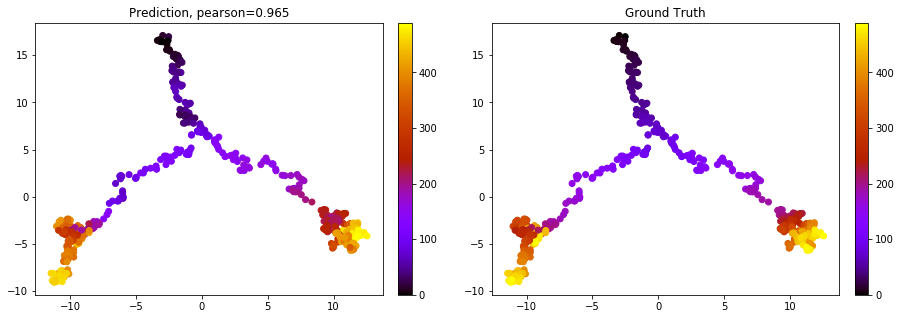

<Figure size 1080x360 with 0 Axes>

0.97087806


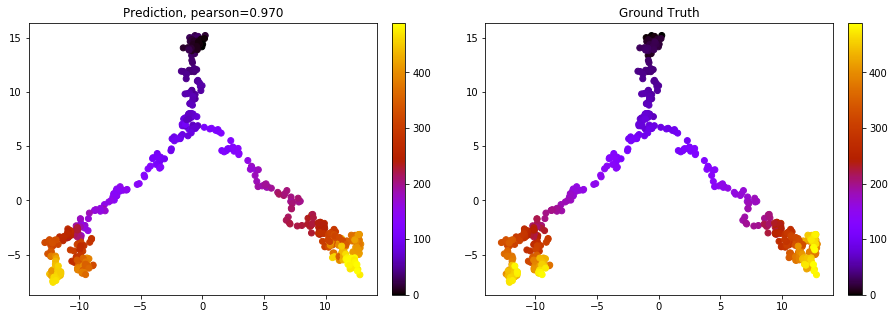

<Figure size 1080x360 with 0 Axes>

0.97104645


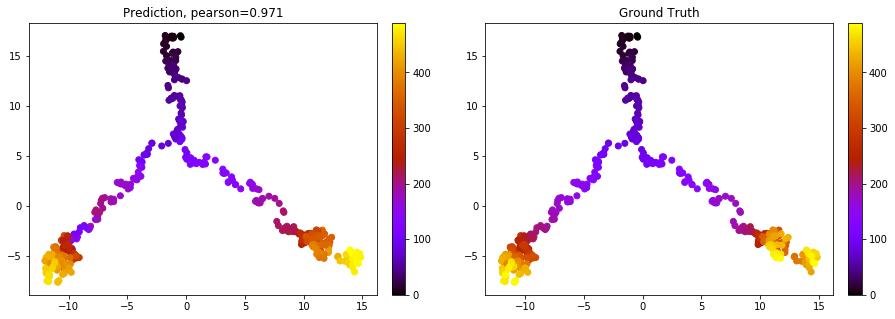

<Figure size 1080x360 with 0 Axes>

0.9731055


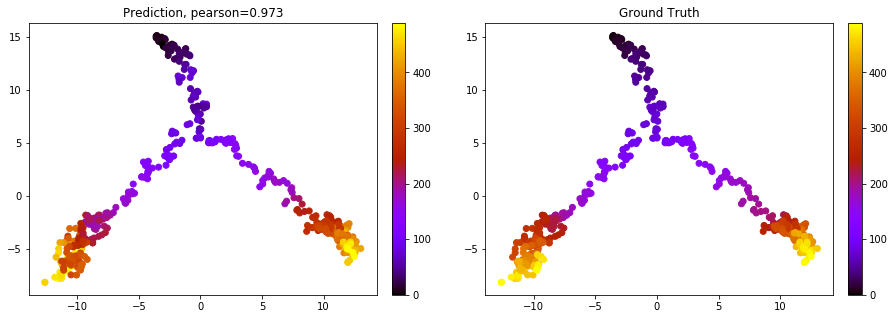

<Figure size 1080x360 with 0 Axes>

0.98147744


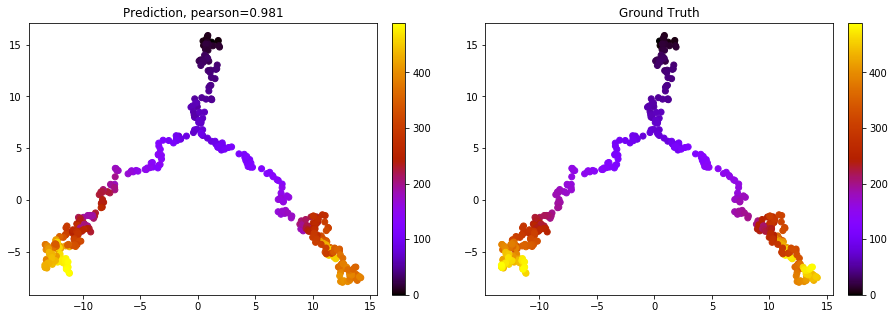

<Figure size 1080x360 with 0 Axes>

0.9383539


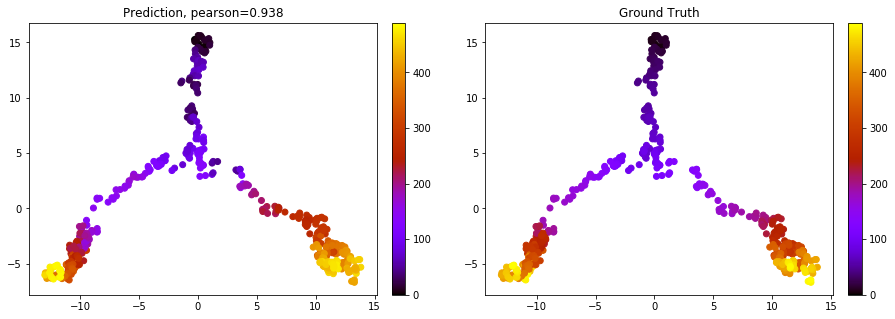

<Figure size 1080x360 with 0 Axes>

0.88494456


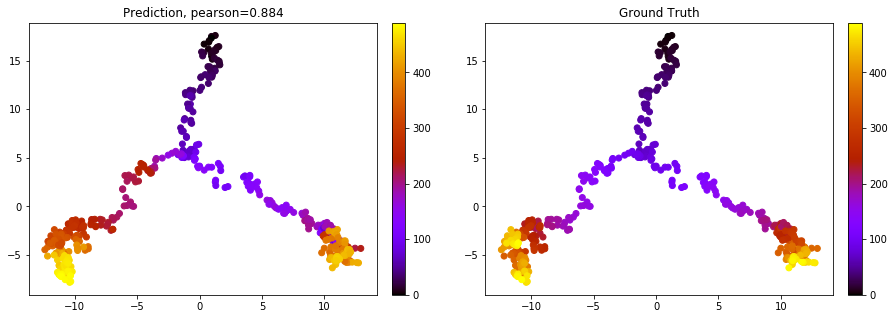

<Figure size 1080x360 with 0 Axes>

0.9862138


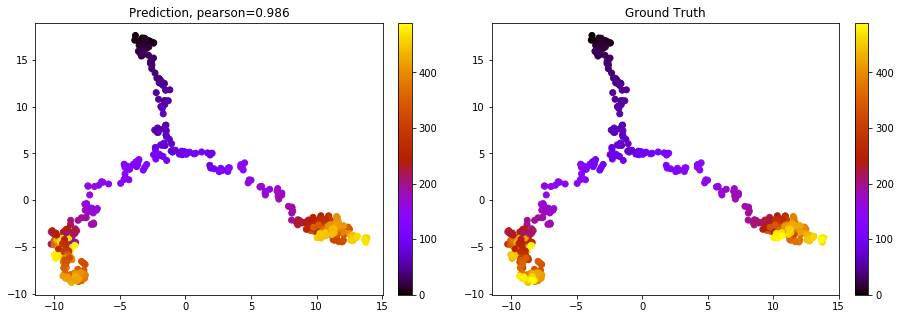

<Figure size 1080x360 with 0 Axes>

0.96377903


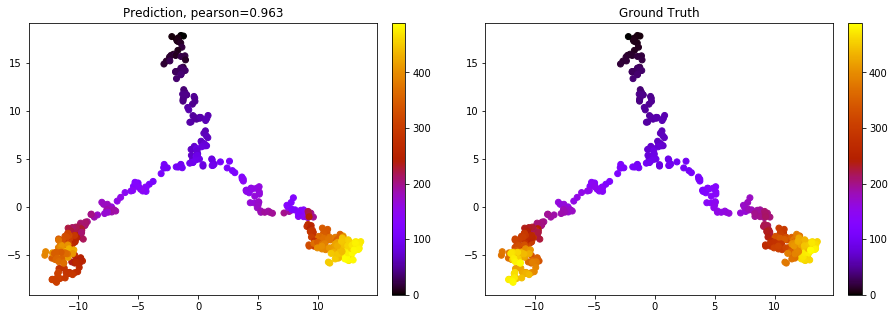

<Figure size 1080x360 with 0 Axes>

0.93096185


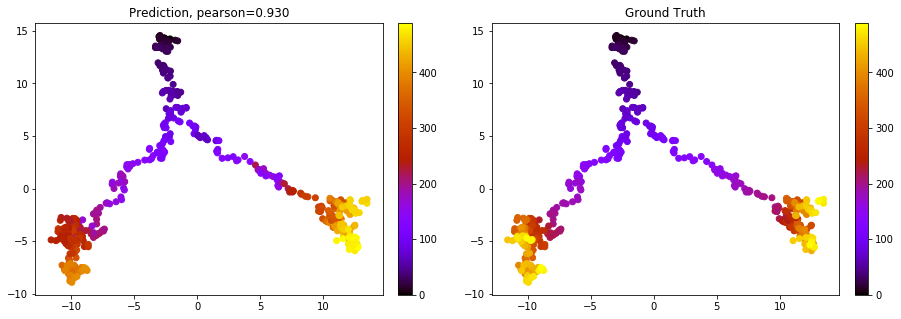

<Figure size 1080x360 with 0 Axes>

In [8]:
val_loader = DataLoader(dataTree[val_mask], batch_size=1)
for idx, data in enumerate(val_loader):
    utils.scatter(model, data, method='pca', metric='pearson', coloring="order")

0.96345335


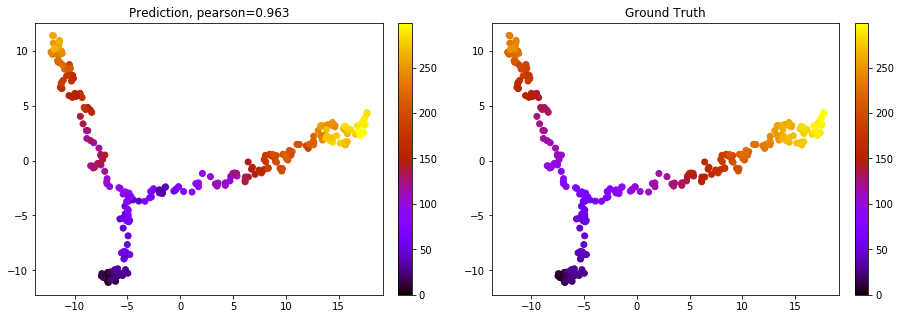

<Figure size 1080x360 with 0 Axes>

0.92012


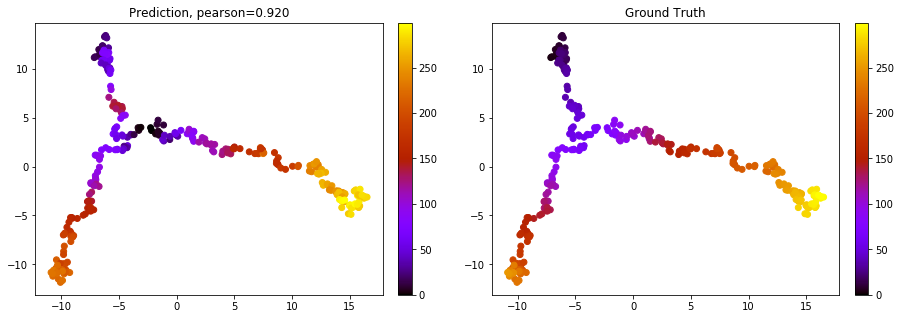

<Figure size 1080x360 with 0 Axes>

0.976432


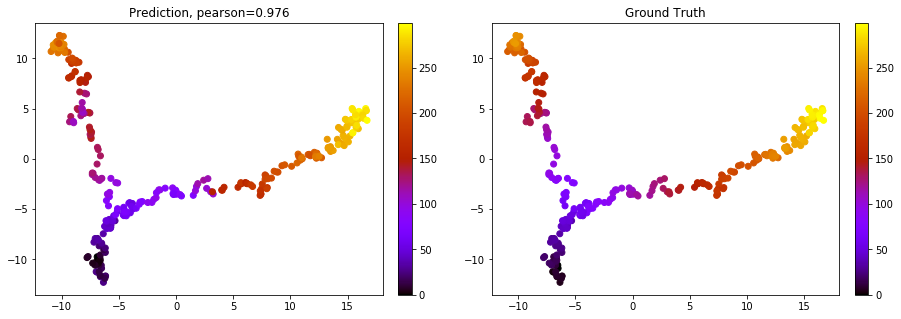

<Figure size 1080x360 with 0 Axes>

0.9631121


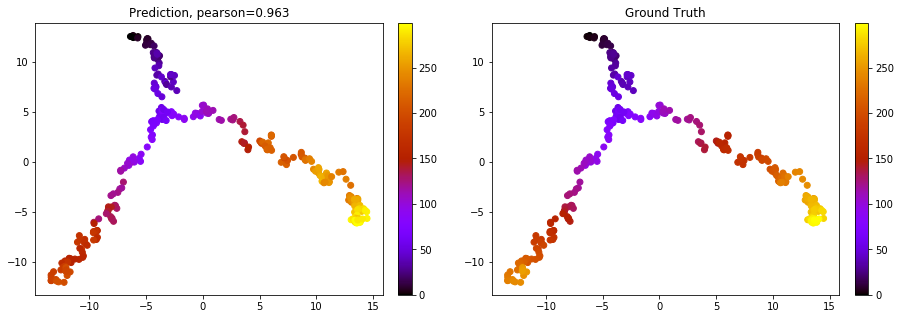

<Figure size 1080x360 with 0 Axes>

0.9481336


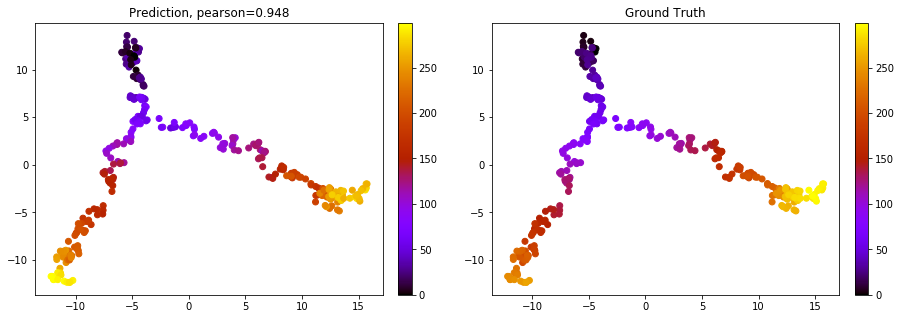

<Figure size 1080x360 with 0 Axes>

0.98687917


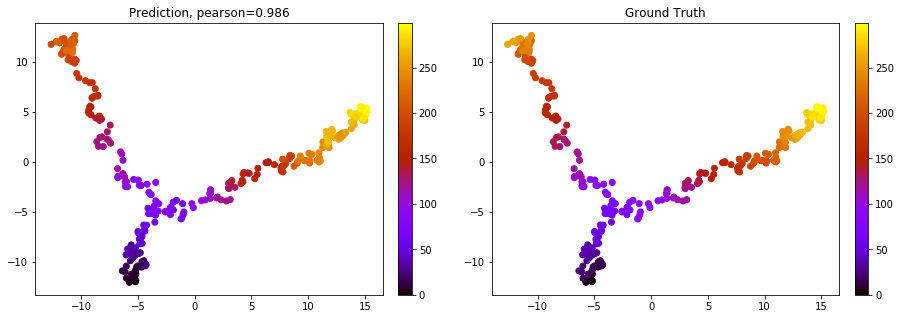

<Figure size 1080x360 with 0 Axes>

In [9]:
bifur_loader = DataLoader(dataBifur[:6])

for data in bifur_loader:
    utils.scatter(model, data, method='pca', metric='pearson', coloring="order")

0.9812364


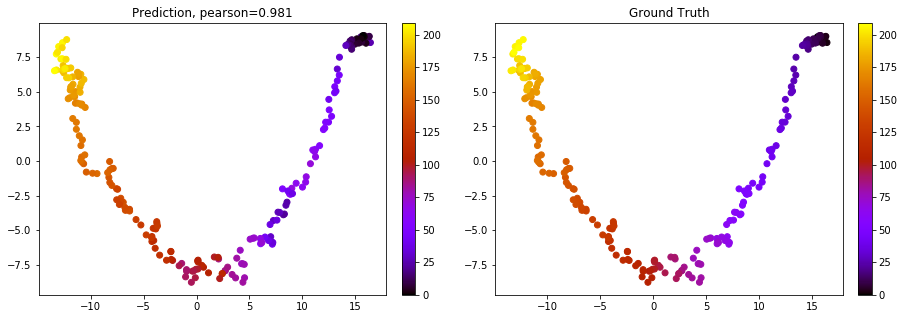

<Figure size 1080x360 with 0 Axes>

0.97765183


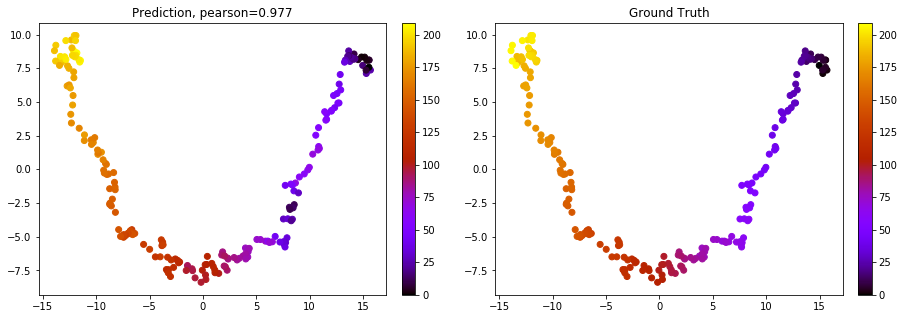

<Figure size 1080x360 with 0 Axes>

0.9533506


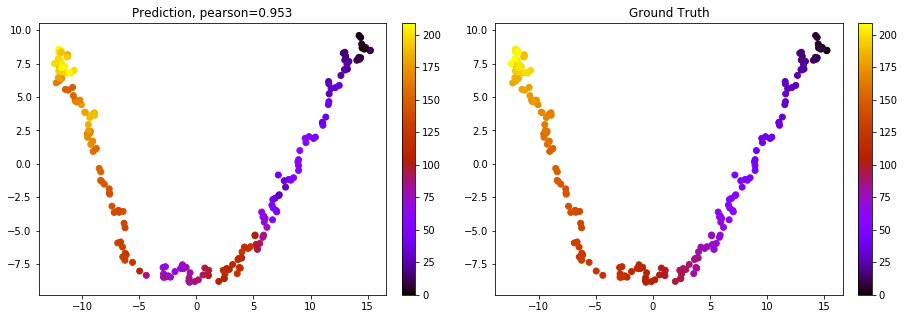

<Figure size 1080x360 with 0 Axes>

0.96292853


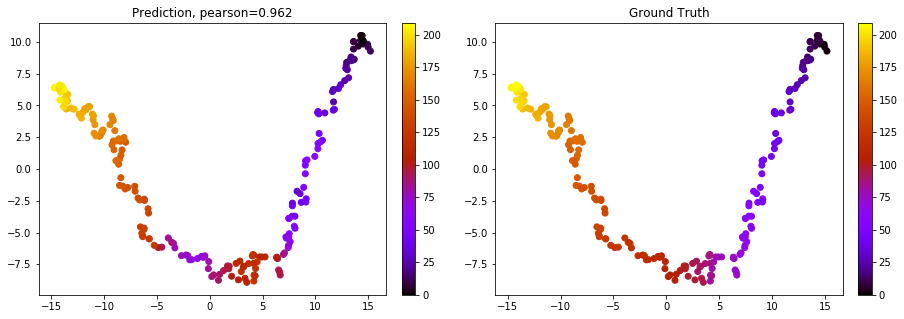

<Figure size 1080x360 with 0 Axes>

0.96877587


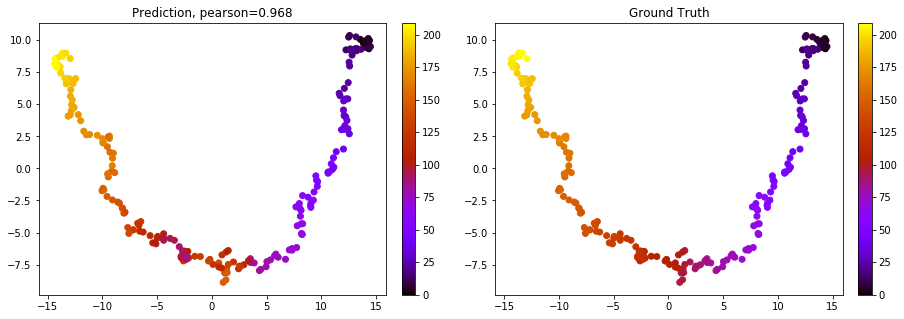

<Figure size 1080x360 with 0 Axes>

0.95487124


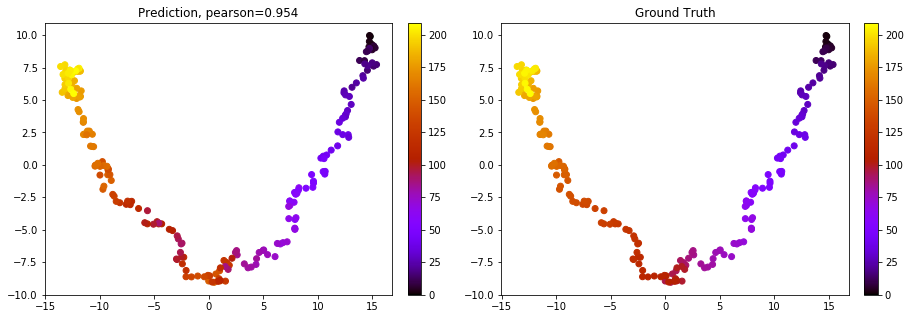

<Figure size 1080x360 with 0 Axes>

In [10]:
branchLoader = DataLoader(dataBranch[:6])
for data in branchLoader:
    utils.scatter(model, data, method='pca', metric='pearson', coloring="order")

0.083091505


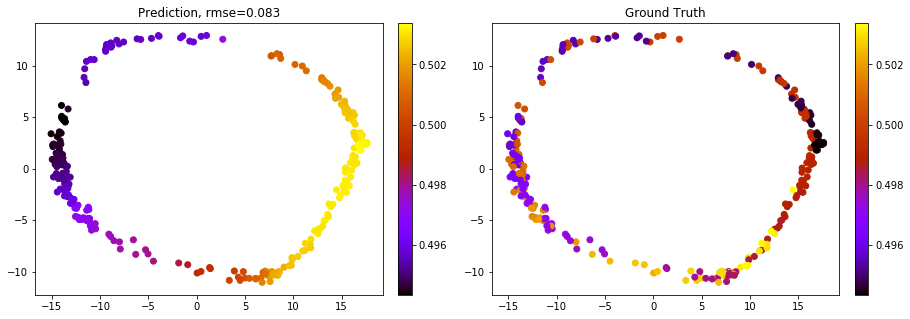

<Figure size 1080x360 with 0 Axes>

0.079878844


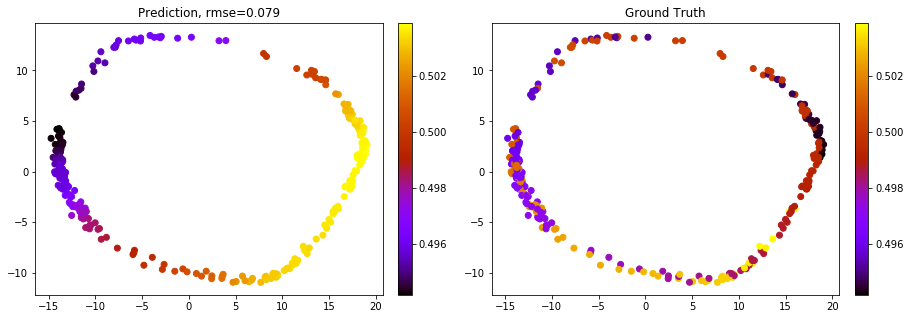

<Figure size 1080x360 with 0 Axes>

0.11679599


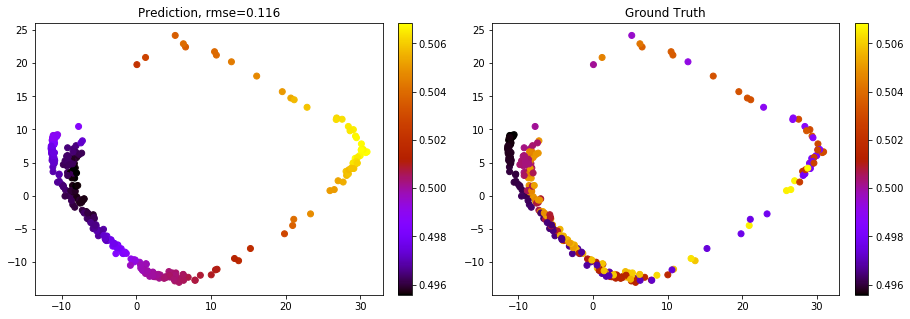

<Figure size 1080x360 with 0 Axes>

0.11647125


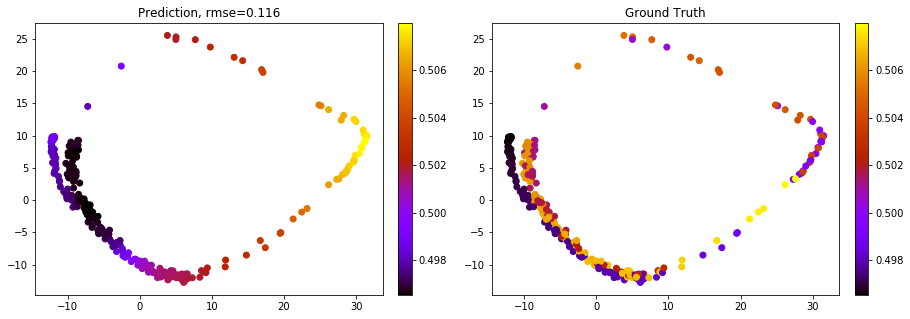

<Figure size 1080x360 with 0 Axes>

In [13]:
circle_loader = DataLoader(dataCircle)

for data in circle_loader:
    utils.scatter(model, data, method='pca', metric='rmse', coloring="pseudo")

# Test Fully connected NN
On both linear, tree, bifurcating and real dataset, without velocity

**Too test if FC NN can work in linear structure, new dataset is needed, as current branch test is meaningless for FC NN**

In [10]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_fc = FCModel(dataset.num_features, device).to(device)

# reset parameters
model_fc.reset_parameters()
print(model)

optimizer = torch.optim.Adam(params=model.parameters(), lr=1e-4, weight_decay=0.01)

train_list = []
val_list = []
for epoch in range(101):

    train_loss = train(model_fc, train_loader,lamb=None)
    train_acc = test(model_fc, train_loader)
    val_acc = test(model_fc, val_loader)
    log = 'Epoch: {:03d}, Loss: {:.4f}, Train: {:.4f}, Val: {:.4f}'
    if epoch % 10 == 0:
        print(log.format(epoch, train_loss, train_acc, val_acc))
    
    train_list.append(train_acc)
    val_list.append(val_acc)

FCModel(
  (lin1): Linear(in_features=300, out_features=64, bias=True)
  (lin2): Linear(in_features=64, out_features=64, bias=True)
  (lin3): Linear(in_features=64, out_features=1, bias=True)
)
Epoch: 000, Loss: -0.4062, Train: -0.7364, Val: -0.6619
Epoch: 010, Loss: -0.9422, Train: -0.9286, Val: -0.8957
Epoch: 020, Loss: -0.9599, Train: -0.9468, Val: -0.9060
Epoch: 030, Loss: -0.9747, Train: -0.9623, Val: -0.9044
Epoch: 040, Loss: -0.9847, Train: -0.9733, Val: -0.9033
Epoch: 050, Loss: -0.9886, Train: -0.9775, Val: -0.9063
Epoch: 060, Loss: -0.9899, Train: -0.9804, Val: -0.9076
Epoch: 070, Loss: -0.9916, Train: -0.9807, Val: -0.9116
Epoch: 080, Loss: -0.9922, Train: -0.9804, Val: -0.9137
Epoch: 090, Loss: -0.9916, Train: -0.9812, Val: -0.9168
Epoch: 100, Loss: -0.9917, Train: -0.9830, Val: -0.9169


0.91287833


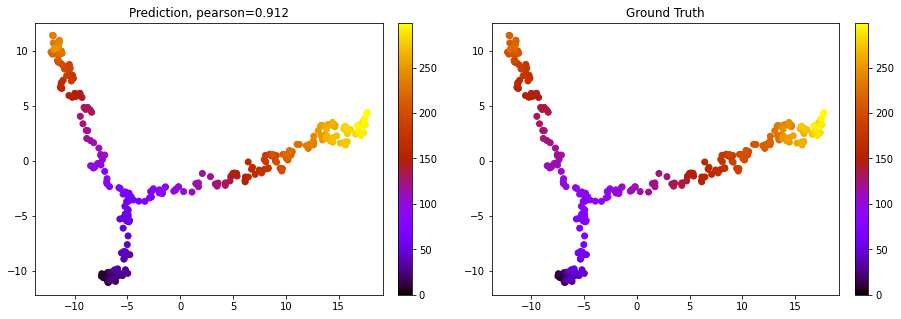

<Figure size 1080x360 with 0 Axes>

0.9205172


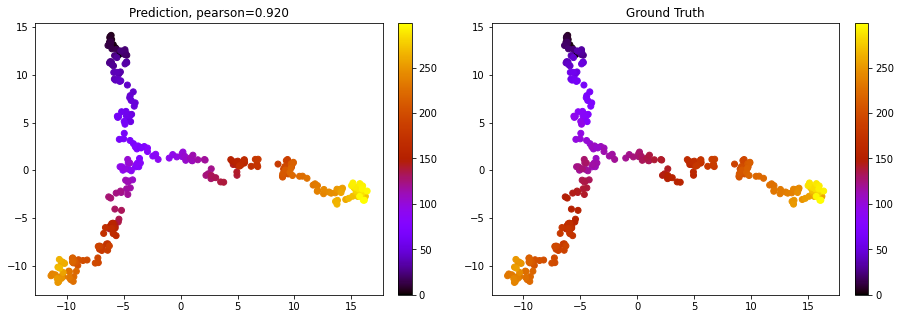

<Figure size 1080x360 with 0 Axes>

0.9576549


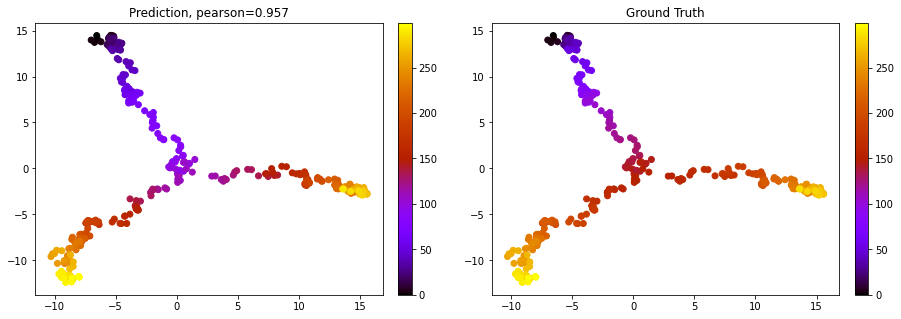

<Figure size 1080x360 with 0 Axes>

0.93074644


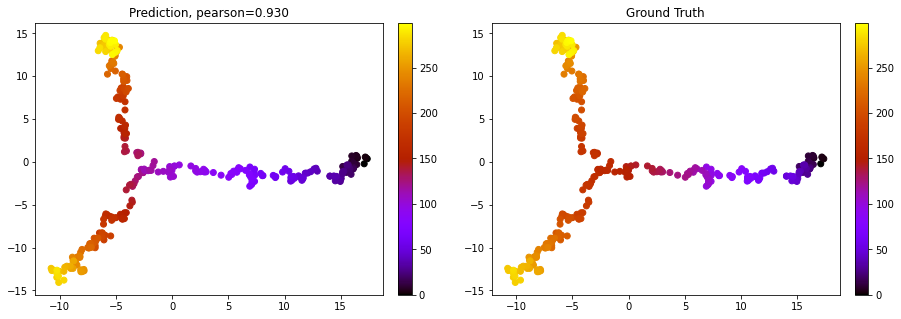

<Figure size 1080x360 with 0 Axes>

0.9236147


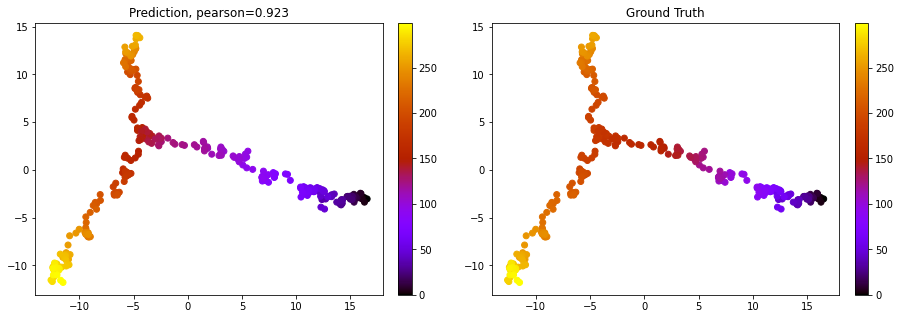

<Figure size 1080x360 with 0 Axes>

0.9252581


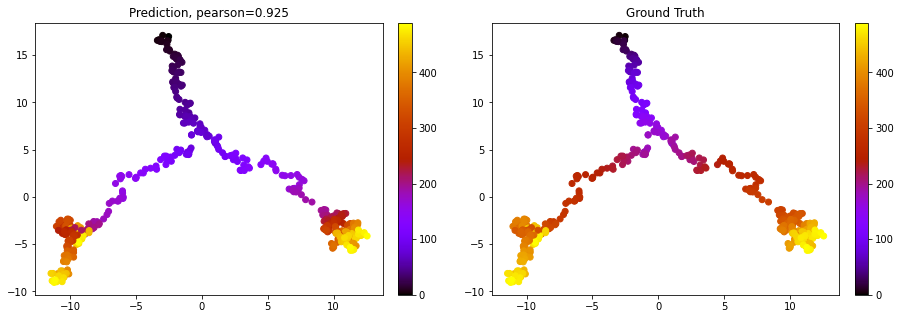

<Figure size 1080x360 with 0 Axes>

0.91513926


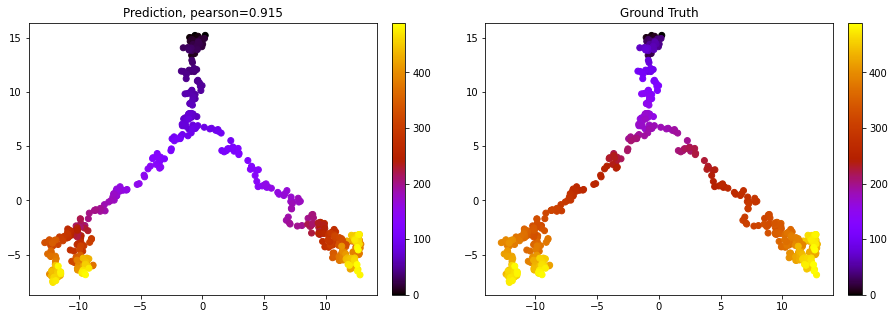

<Figure size 1080x360 with 0 Axes>

0.9065548


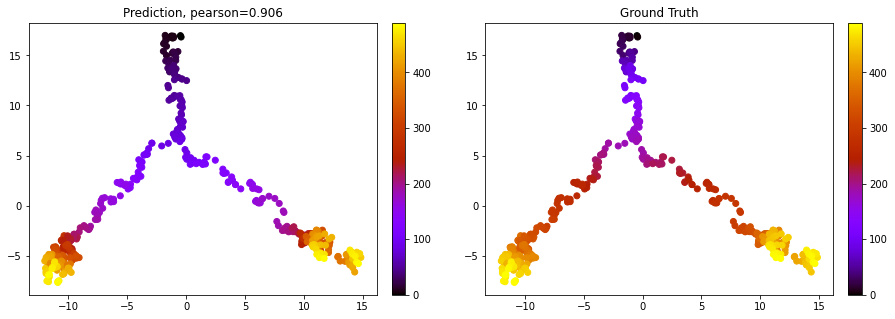

<Figure size 1080x360 with 0 Axes>

0.94094634


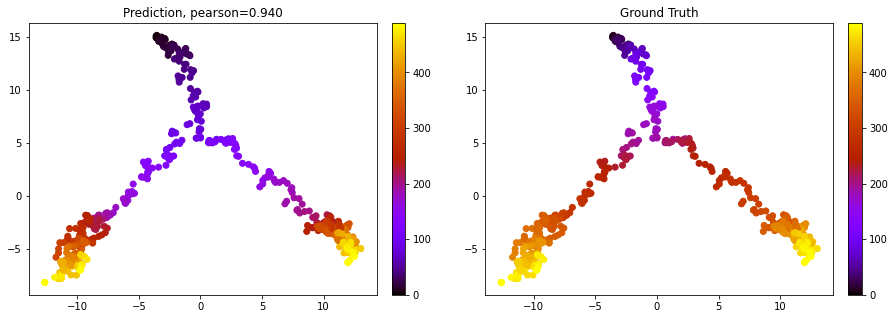

<Figure size 1080x360 with 0 Axes>

0.9748482


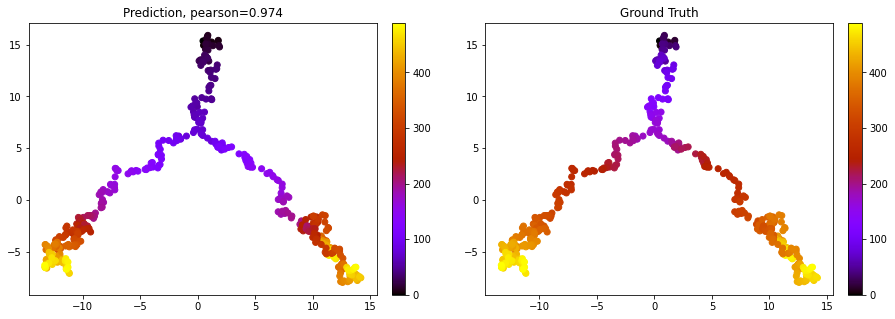

<Figure size 1080x360 with 0 Axes>

0.91770834


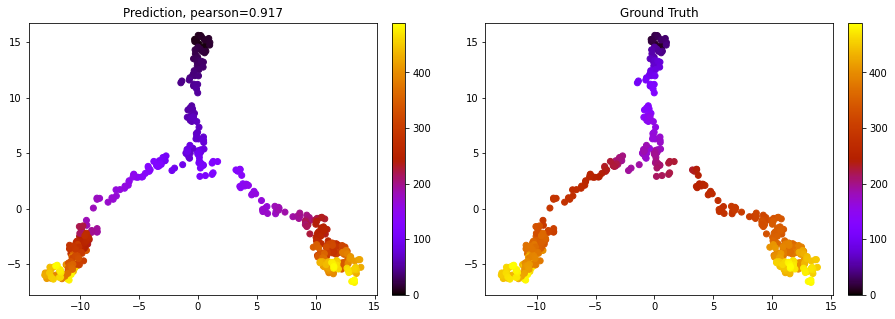

<Figure size 1080x360 with 0 Axes>

0.88264537


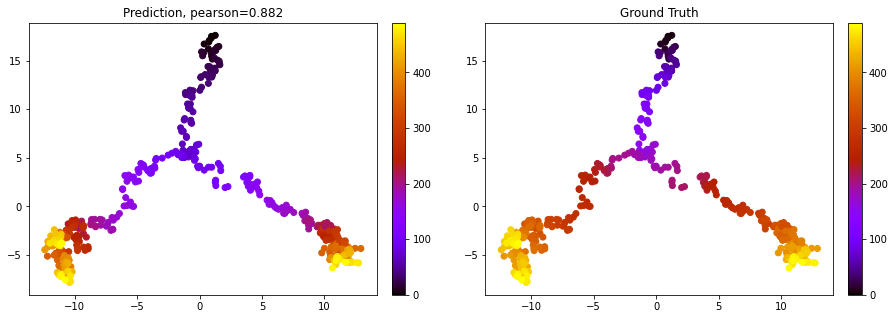

<Figure size 1080x360 with 0 Axes>

0.9508522


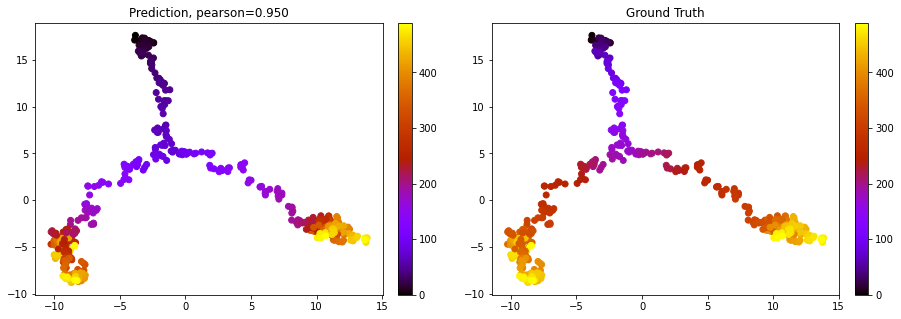

<Figure size 1080x360 with 0 Axes>

0.9425184


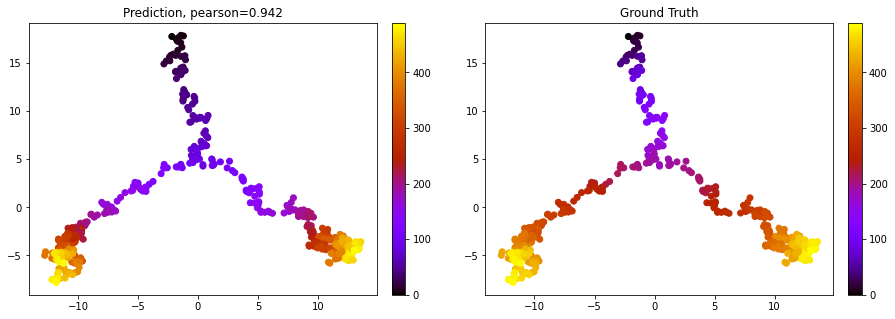

<Figure size 1080x360 with 0 Axes>

0.94389564


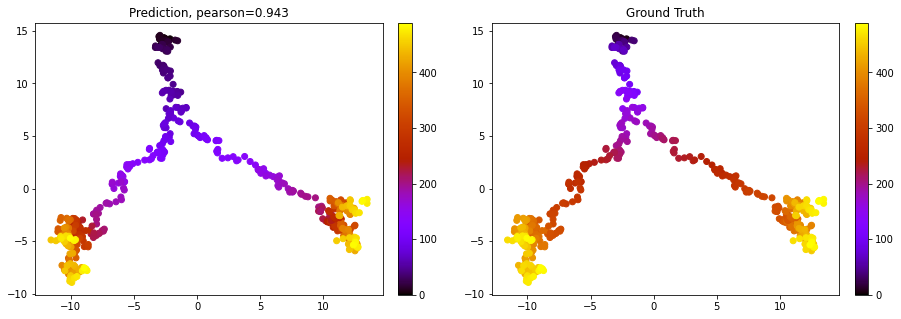

<Figure size 1080x360 with 0 Axes>

In [11]:
for idx, data in enumerate(val_loader):
    if idx == 0:
        data_bifur = data
    if idx == 6:
        data_tree = data
    utils.scatter(model, data, method='pca', metric='pearson', coloring="order")

0.9555859


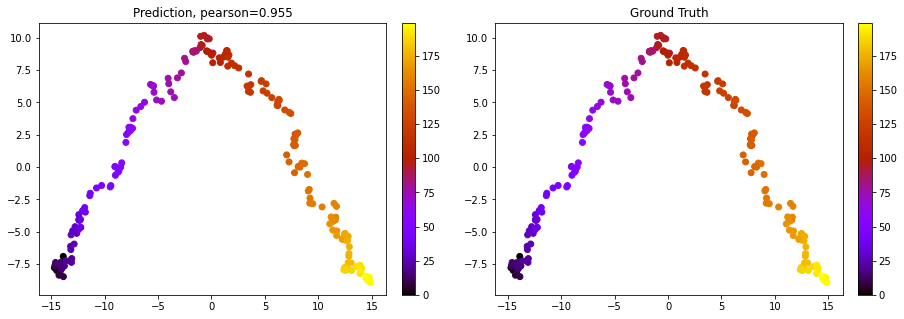

<Figure size 1080x360 with 0 Axes>

0.9217646


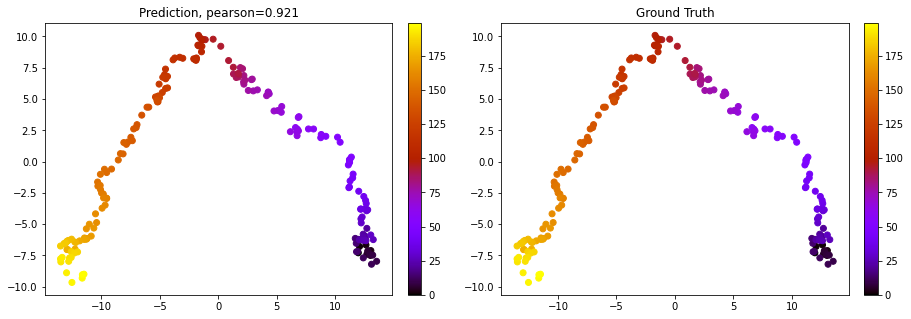

<Figure size 1080x360 with 0 Axes>

0.92824996


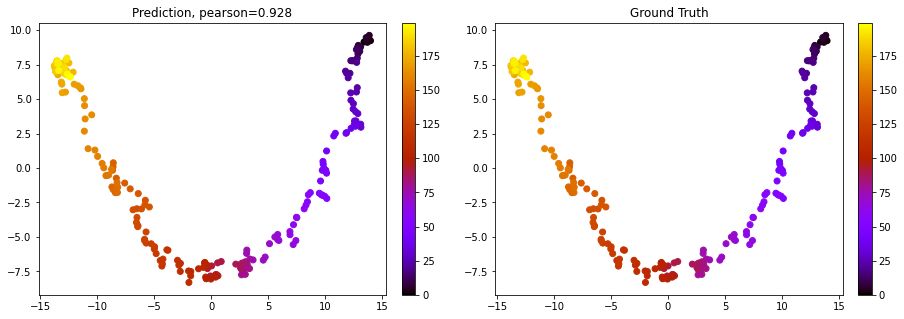

<Figure size 1080x360 with 0 Axes>

0.9511047


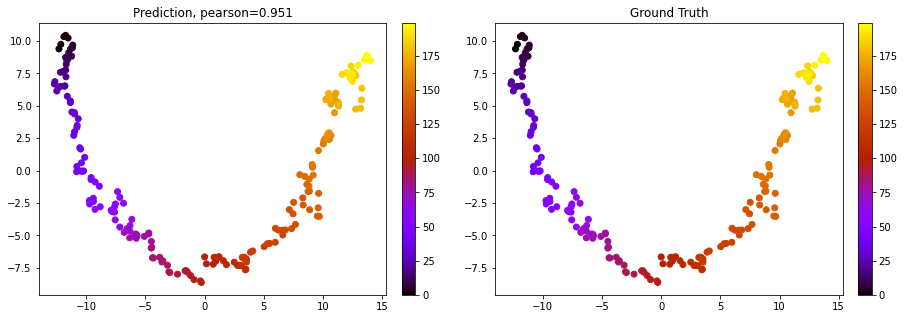

<Figure size 1080x360 with 0 Axes>

0.9466658


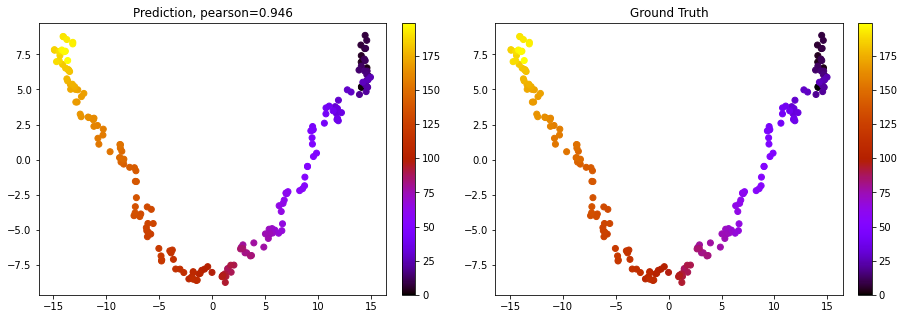

<Figure size 1080x360 with 0 Axes>

In [14]:
for data in linear_loader2:
    utils.scatter(model, data, method='pca', metric='pearson', coloring="order")

0.16050036


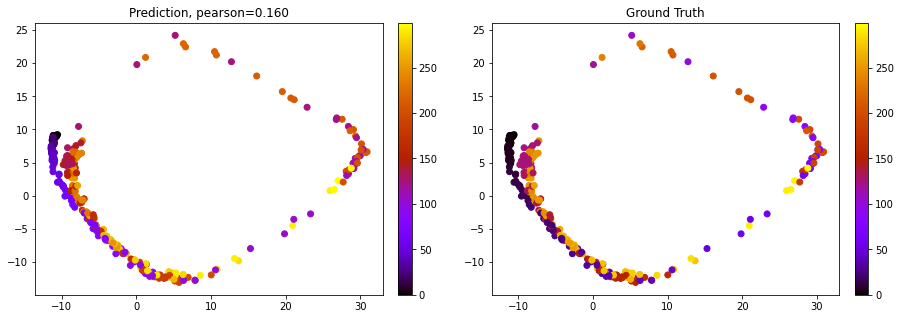

<Figure size 1080x360 with 0 Axes>

-0.0091702845


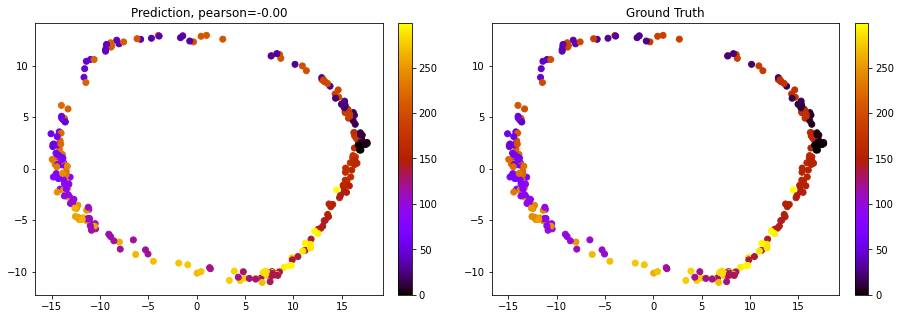

<Figure size 1080x360 with 0 Axes>

0.05310622


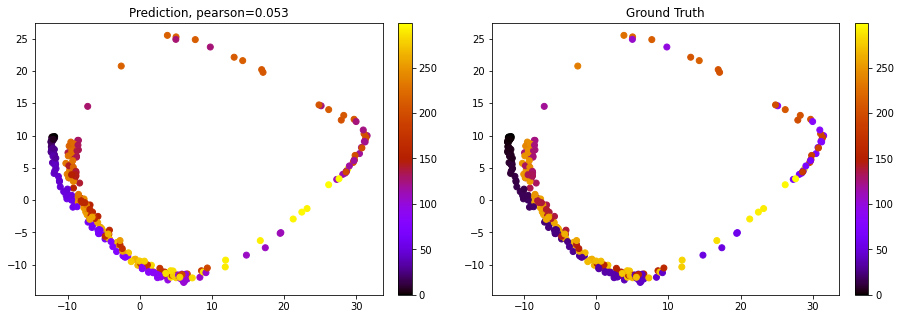

<Figure size 1080x360 with 0 Axes>

0.0012701624


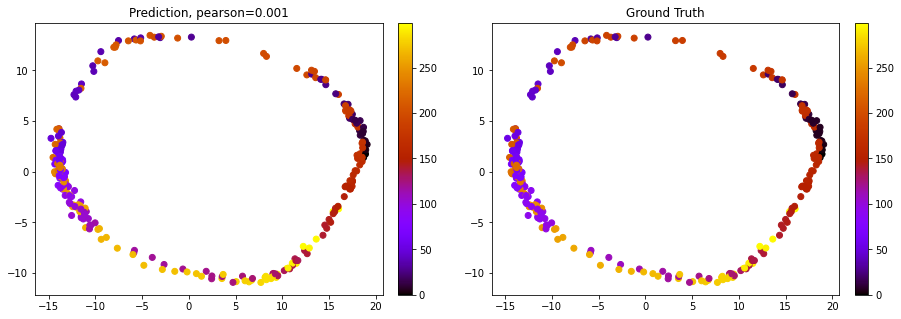

<Figure size 1080x360 with 0 Axes>

In [12]:
circle_loader = DataLoader(dataCircle, batch_size=1, shuffle=True)

for data in circle_loader:
    utils.scatter(model, data, method='pca', metric='pearson', coloring="order")

In [11]:
import scanpy as sc
real_file = "./data/real_dataset/"
cell_annot = pd.read_csv(real_file + "Paul_cell_meta.txt", sep="\t")
expr = pd.read_csv(real_file + "Paul_expr.txt", sep="\t")
adata = anndata.AnnData(X=expr.T, obs = cell_annot)
sc.pp.filter_genes(adata, min_counts = 20)
sc.pp.normalize_per_cell(adata)
sc.pp.filter_genes_dispersion(adata, n_top_genes= 300)
sc.pp.log1p(adata)
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_neighbors=10)
sc.tl.umap(adata)

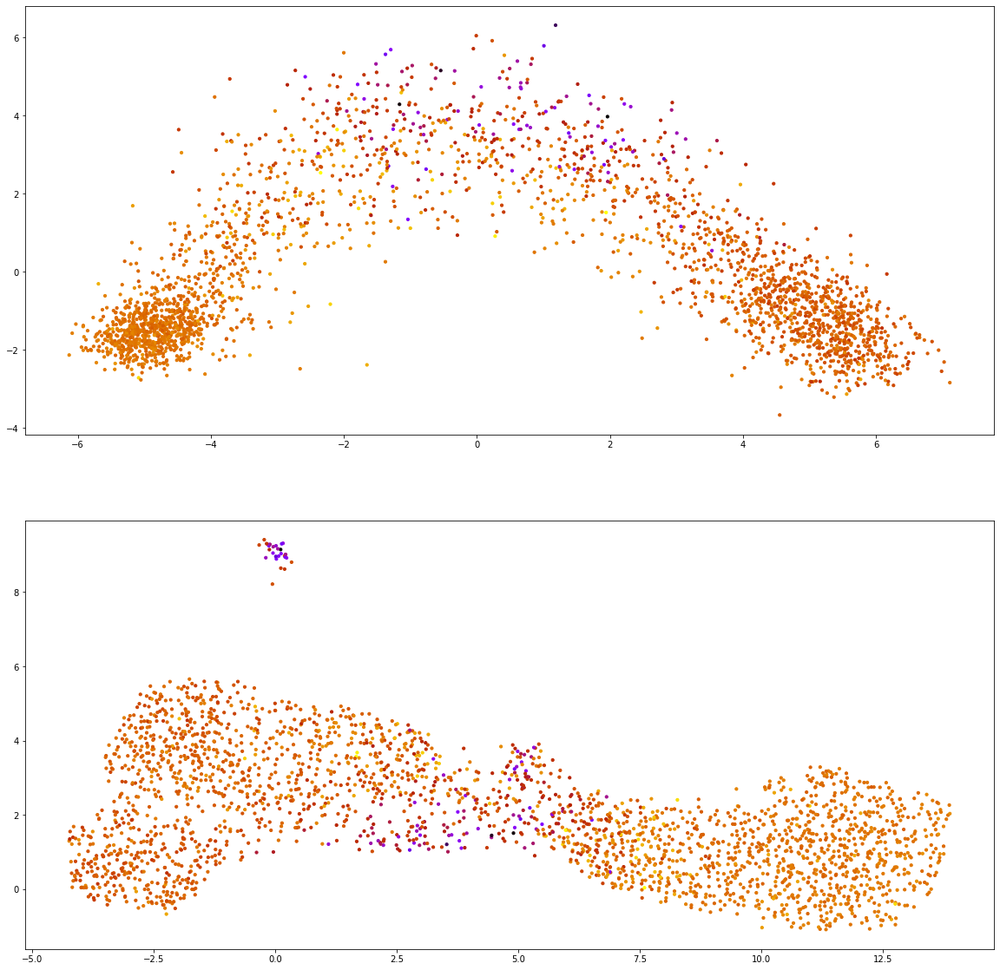

In [14]:
other_index = ~(adata.obs["cell_type2"] == 'Multipotent progenitors').values

X_spliced = adata.X
# X_spliced is original, X_pca is after pca
x = X_spliced.copy()
x = StandardScaler().fit_transform(x)
x = torch.FloatTensor(x)
data = Data(x=x)
# X should be something before pca
X = data.x.numpy()

X_pca = adata.obsm['X_pca']
X_umap = adata.obsm['X_umap']

data = data.to(device)
pred,_,_ = model(data)
pred = pred.detach().cpu().numpy().reshape(-1)


fig, (ax1,ax2) = plt.subplots(2, 1, figsize=(20,20))
ax1.scatter(X_pca[:,0],X_pca[:,1], cmap = 'gnuplot', c = pred, s = 10)
# ax1.scatter(X_pca[other_index,0],X_pca[other_index,1], color = "gray", s = 15)

ax2.scatter(X_umap[:,0], X_umap[:,1], cmap = 'gnuplot', c = pred, s = 10)
# ax2.scatter(X_umap[other_index,0],X_umap[other_index,1], color = "gray", s = 15)

# ax1.scatter(X_pca[:,0],X_pca[:,1], cmap = 'gnuplot', color = adata.obs['cell_type2'].to_numpy())
plt.show()

In [54]:
def slingshot_visual(data, results, trajs = None, show_pcurve = True, figsize = (20,10), save_as = None):
    X = data.x.numpy()
    X_pca = utils.pca_op(X, n_comps = 2, standardize=False)
    label = data.y.numpy().squeeze()

    if trajs == None:
        trajs = results['pseudotime'].shape[1]
    ncols = np.ceil(trajs).astype('int32')
    nrows = 1
    fig, axs = plt.subplots(nrows = nrows, ncols = ncols, figsize = figsize)
    fig.suptitle("slingshot pseudo-time", fontsize = 18)
    for i in range(trajs):
        if nrows == 1 or ncols == 1:
            if nrows == 1 and ncols == 1:
                ax = axs
            else:
                ax = axs[i]
        else:
            ax = axs[i%nrows, i//nrows]
        ax.scatter(X_pca[:,0],X_pca[:,1], color = 'gray', alpha = 0.1)
        if show_pcurve:
            # for curve in results['curves']:
            ax.plot(results['curves'][i,:,0],results['curves'][i,:,1],color = 'black')

        cells = results['pseudotime'].iloc[:,i]
        # eliminate `cell` in the string
        cells_index = [x for x in cells.index if not np.isnan(cells[x])]
        ordering = [x for x in cells[cells_index].sort_values().index]

        pred = [np.nanmean(x) for x in results["pseudotime"].values]

        vx = pred - np.mean(pred)
        vy = label - np.mean(label)
        pearson = np.sum(vx * vy) / (np.sqrt(np.sum(vx ** 2)) * np.sqrt(np.sum(vy ** 2)))

        X_traj = X_pca[ordering,:]

        pseudo_visual = ax.scatter(X_traj[:,0],X_traj[:,1],c = np.arange(X_traj.shape[0]), cmap=plt.get_cmap('gnuplot'),alpha = 0.7)
        fig.colorbar(pseudo_visual,fraction=0.046, pad=0.04, ax = ax)
        ax.set_title("reconstructed trajectory " + str(i))
        fig.suptitle("Pearson correlationship: "+ str(pearson))
    if save_as != None:
        fig.savefig(save_as)
    plt.show()    
    return pearson 

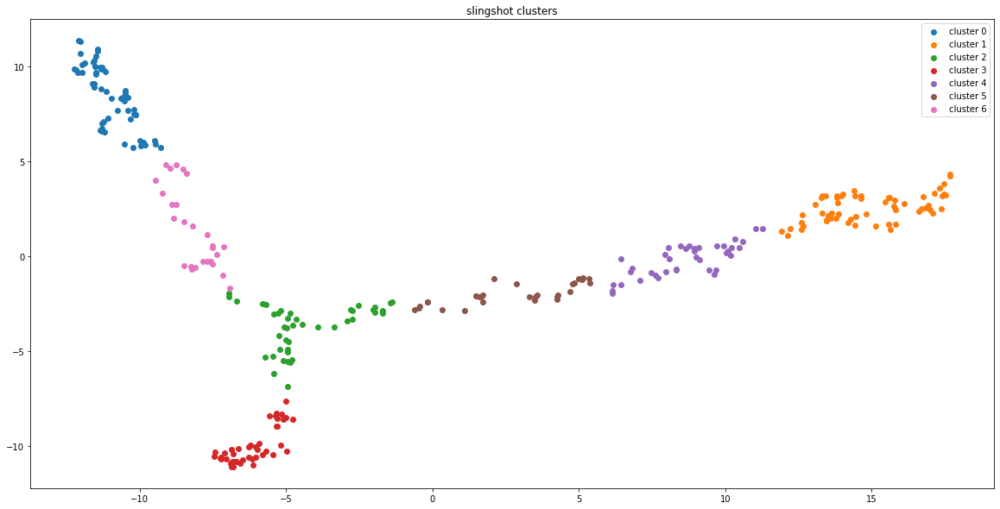

In [57]:
X = data_bifur.x.numpy()
X_pca = utils.pca_op(X, n_comps = 2, standardize=False)
from sklearn.cluster import KMeans
n_clusters = 7
init = "k-means++"
n_init = 10
max_iter = 300
tol = 0.0001
kmeans = KMeans(n_clusters, init, n_init, max_iter, tol)
groups = kmeans.fit_predict(X_pca)

fig = plt.figure(figsize = (20,10))
ax = fig.add_subplot()
# c_range = [eval(x) if isinstance(x, str) else x for x in adata.obs['sim_time']]
clusters = int(np.max(groups)+1)
for i in range(clusters):
    sub_cells = np.where(groups == i)[0]
    progression = ax.scatter(X_pca[sub_cells,0], X_pca[sub_cells,1], cmap = plt.get_cmap('Pastel1'))

ax.legend(['cluster '+ str(i) for i in range(clusters)])
ax.set_title("slingshot clusters")

X_pca_df = pd.DataFrame(columns= np.arange(X_pca.shape[1]), data = X_pca)

R[write to console]: Using full covariance matrix


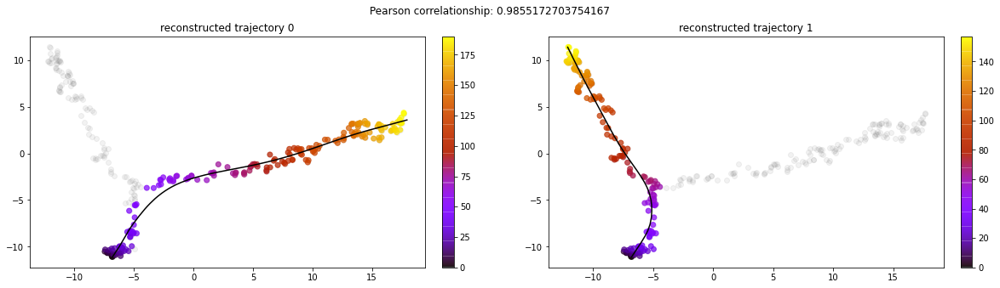

0.9855172703754167

In [60]:
results = scprep.run.Slingshot(X_pca_df, groups, start_cluster = 3)
slingshot_visual(data_bifur, results, trajs = None, show_pcurve = True, figsize = (20,5), save_as = None)

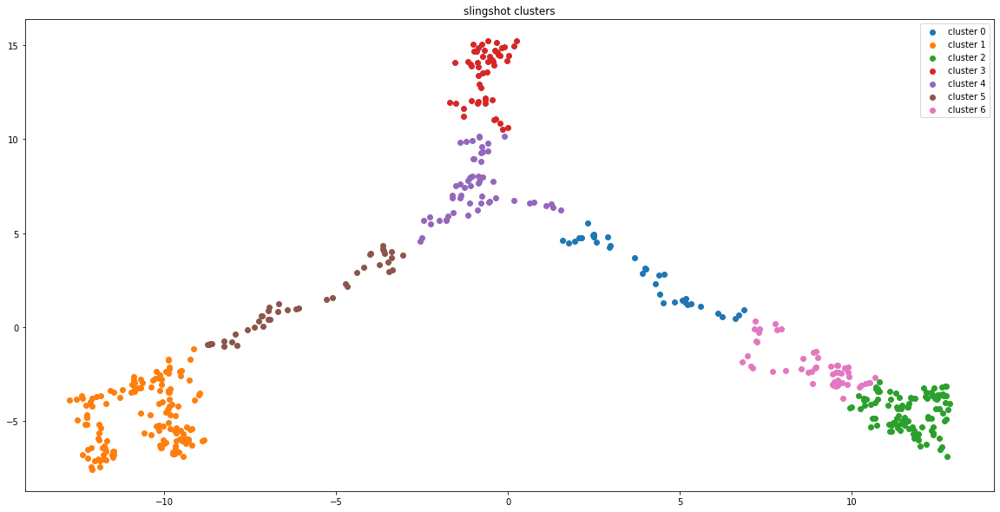

In [61]:
X = data_tree.x.numpy()
X_pca = utils.pca_op(X, n_comps = 2, standardize=False)
from sklearn.cluster import KMeans
n_clusters = 7
init = "k-means++"
n_init = 10
max_iter = 300
tol = 0.0001
kmeans = KMeans(n_clusters, init, n_init, max_iter, tol)
groups = kmeans.fit_predict(X_pca)

fig = plt.figure(figsize = (20,10))
ax = fig.add_subplot()
# c_range = [eval(x) if isinstance(x, str) else x for x in adata.obs['sim_time']]
clusters = int(np.max(groups)+1)
for i in range(clusters):
    sub_cells = np.where(groups == i)[0]
    progression = ax.scatter(X_pca[sub_cells,0], X_pca[sub_cells,1], cmap = plt.get_cmap('Pastel1'))

ax.legend(['cluster '+ str(i) for i in range(clusters)])
ax.set_title("slingshot clusters")

X_pca_df = pd.DataFrame(columns= np.arange(X_pca.shape[1]), data = X_pca)

R[write to console]: Using full covariance matrix


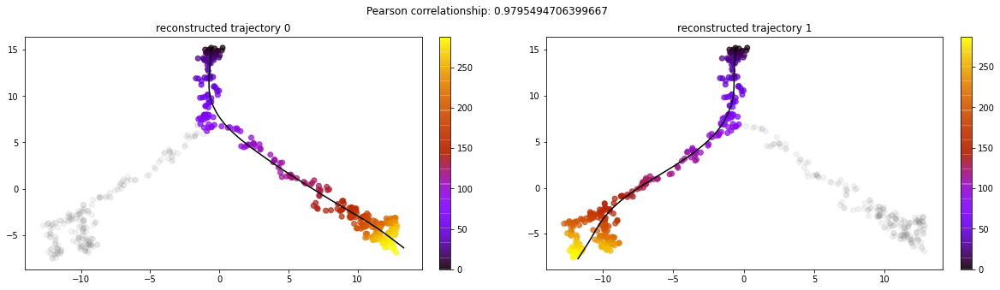

0.9795494706399667

In [64]:
results = scprep.run.Slingshot(X_pca_df, groups, start_cluster = 3)
slingshot_visual(data_tree, results, trajs = None, show_pcurve = True, figsize = (20,5), save_as = None)